In [30]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split


In [31]:
df = pd.read_csv("iris.data", sep=",", encoding="utf-8", header=None)
iris_cls = df[4]
x_train, x_test, y_train, y_test = train_test_split(df.drop([4], axis="columns"), iris_cls, test_size = 0.2, random_state = 42)

Задание 1. Построить дерево решений для набора iris.dat.

In [32]:
from sklearn.tree import plot_tree
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier


cls_tree = DecisionTreeClassifier(max_depth=5)

x_train, y_train = df.drop([4], axis="columns"), iris_cls
x_test, y_test = x_train, y_train

cls_tree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=5)

1.0


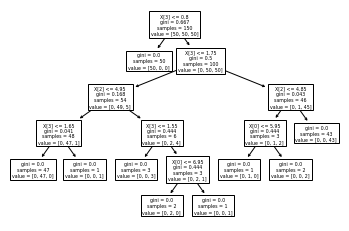

In [36]:
predicted_val = cls_tree.predict(x_test)
print(accuracy_score(predicted_val, y_test))
plot_tree(cls_tree)
cls_tree.s
plt.show()

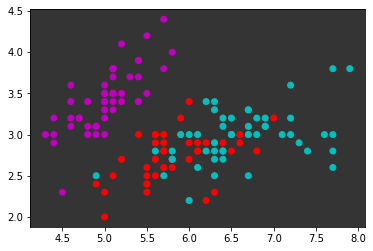

In [40]:
fig, ax = plt.subplots(1)
ax.set_facecolor([0.207, 0.205, 0.204])
d = {"Iris-virginica" : 'c', "Iris-setosa" :'m', "Iris-versicolor" : 'r'}
plt.scatter(x=x_test[0], y=x_test[1], c=list(map(lambda el : d[el] ,y_test)))
plt.show()

Задание 2. Для наборов данных dataset1.csv, dataset2.csv, dataset3.csv применить
KNN (k=3), наивный байесовский классификатор и деревья решений
(максимальная глубина=5). Для всех случаев нарисовать:
• само множество – диаграмма рассеяния (отметив классы разным цветом),
• решающую границу,
• точки из обучающего и тестового множеств (пропорция 0.6/0.4),
• точность классификации.

In [41]:
df1 = pd.read_csv("dataset1.csv", sep=",", encoding="utf-8")
df2 = pd.read_csv("dataset2.csv", sep=",", encoding="utf-8")
df3 = pd.read_csv("dataset3.csv", sep=",", encoding="utf-8")

datasets = [df1,df2,df3]


In [66]:
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.naive_bayes import GaussianNB

colors = ['c', 'm']

def model_bound(m):
    xx = np.linspace(-4, 4, 65)
    yy = np.linspace(-4, 4, 65)
    points = np.array([
        [x, y] for x in xx for y in yy
    ])
    plt.scatter(points[:, 0], points[:, 1], c=m.predict(points), alpha=0.2)

dataset 1
tree_predicted accuracy 0.95


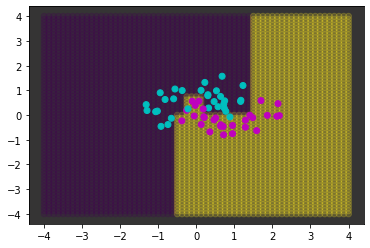

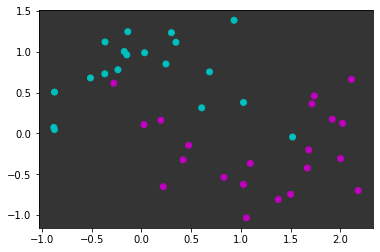

nb_predicted accuracy 0.875


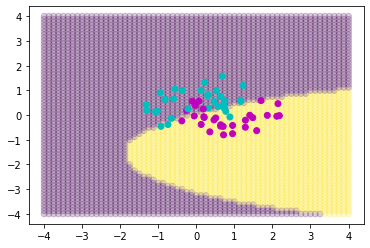

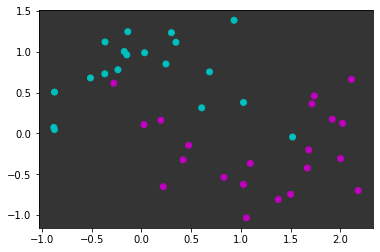

knn_predicted accuracy 0.95


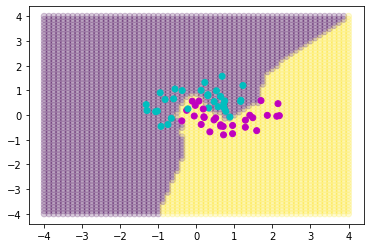

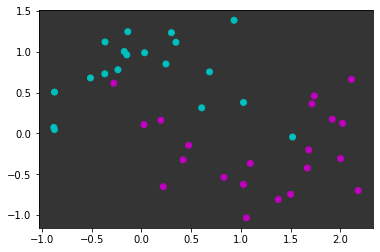

--------------------------
dataset 2
tree_predicted accuracy 0.775


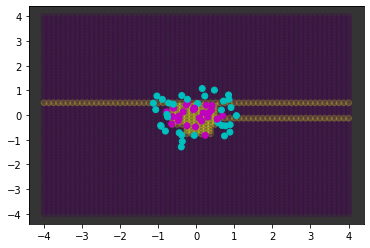

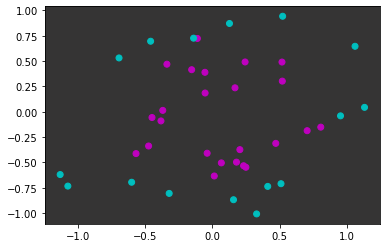

nb_predicted accuracy 0.7


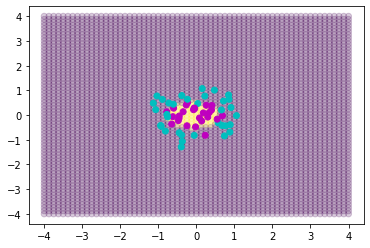

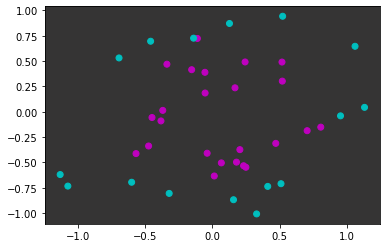

knn_predicted accuracy 0.925


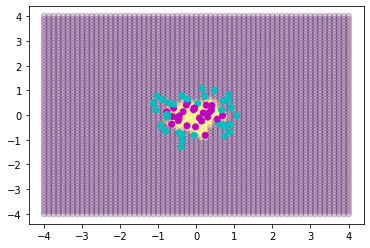

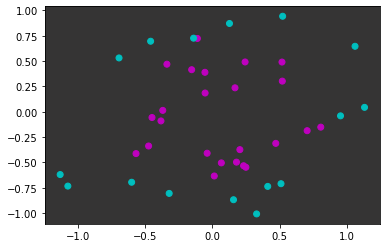

--------------------------
dataset 3
tree_predicted accuracy 0.95


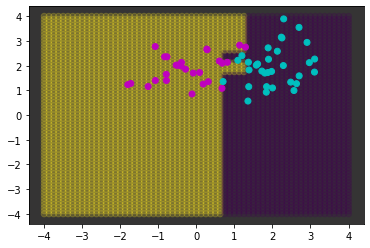

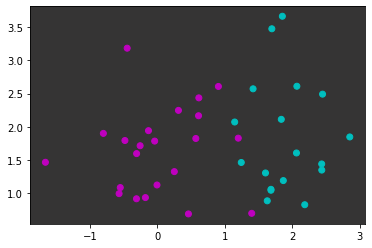

nb_predicted accuracy 0.95


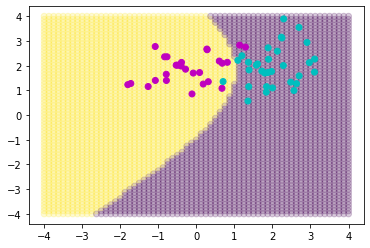

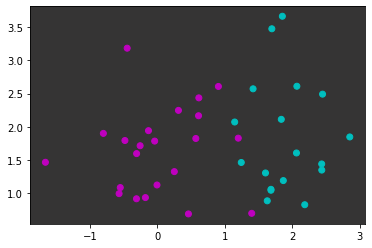

knn_predicted accuracy 0.925


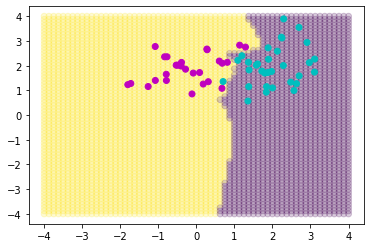

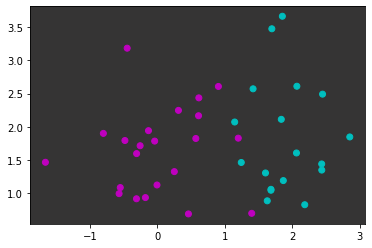

--------------------------


In [67]:
knn = KNN(n_neighbors =3)
nb = GaussianNB()
idx = 0

for ds in datasets:
    idx += 1
    knn = KNN(n_neighbors =3)
    nb = GaussianNB()
    cls_tree = DecisionTreeClassifier(max_depth=5)


    x_train, x_test, y_train, y_test = train_test_split(ds.drop(['Y'], axis="columns"), ds['Y'], test_size = 0.4, random_state = 42)
    knn.fit(x_train, y_train)
    nb.fit(x_train, y_train)
    cls_tree.fit(x_train, y_train)
    
    tree_predicted = cls_tree.predict(x_test)
    nb_predicted = nb.predict(x_test)
    knn_predicted = knn.predict(x_test)

    fig, ax = plt.subplots(1)
    ax.set_facecolor([0.207, 0.205, 0.204])

    print('dataset ' + str(idx))
    print("tree_predicted accuracy " + str(accuracy_score(tree_predicted, y_test)))
    model_bound(cls_tree)
    plt.scatter(x_train['X1'], x_train['X2'], c=list(map(lambda el : colors[int(el)], y_train)))
    plt.show()

    fig, ax = plt.subplots(1)
    ax.set_facecolor([0.207, 0.205, 0.204])

    plt.scatter(x_test['X1'], x_test['X2'], c=list(map(lambda el : colors[int(el)], y_test)))
    plt.show()
    print("nb_predicted accuracy " +str(accuracy_score(nb_predicted, y_test)))
    model_bound(nb)
    plt.scatter(x_train['X1'], x_train['X2'], c=list(map(lambda el : colors[int(el)], y_train)))
    plt.show()

    fig, ax = plt.subplots(1)
    ax.set_facecolor([0.207, 0.205, 0.204])
    
    plt.scatter(x_test['X1'], x_test['X2'], c=list(map(lambda el : colors[int(el)], y_test)))
    plt.show()
    print("knn_predicted accuracy " +str(accuracy_score(knn_predicted, y_test)))
    model_bound(knn)
    plt.scatter(x_train['X1'], x_train['X2'], c=list(map(lambda el : colors[int(el)], y_train)))
    plt.show()

    fig, ax = plt.subplots(1)
    ax.set_facecolor([0.207, 0.205, 0.204])
    
    plt.scatter(x_test['X1'], x_test['X2'], c=list(map(lambda el : colors[int(el)], y_test)))
    plt.show()
    print('--------------------------')
    
    
